# Simulation results Palma

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.io.img_tiles as cimgt

In [2]:
tasks = pd.read_csv(
            "palmadata/palmapointsofinterest_cleaned.csv", 
            header = 0,
            dtype = {
                "place": 'str',
                "description": 'str',
                "latitude": 'float',
                "longitude": 'float',
                "stars": 'float',
                "reviews": 'float'
            }
        )

## 100 tourists

In [3]:
troutes = pd.read_csv(
            "palmadata/palma_poi_troutes_100_20.csv", 
            header=0,
            dtype=int
        )
summary = pd.read_csv(
            "palmadata/palma_poi_summary_100_20.csv", 
            header=0,
            dtype=int
        )

In [4]:
troutes

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,0,24,47,53,31,40,22,36,13,36,...,11,30,44,23,34,44,49,45,34,0
1,0,5,26,35,17,29,48,49,46,55,...,28,8,44,49,16,54,32,41,14,0
2,0,47,11,55,14,15,2,28,1,47,...,41,42,31,11,12,7,48,43,17,0
3,0,46,14,49,39,8,15,30,39,26,...,29,1,36,42,52,13,37,44,16,0
4,0,49,46,23,44,4,34,1,6,18,...,11,13,54,51,44,47,16,48,22,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0,31,7,46,42,1,30,45,34,47,...,2,4,47,54,14,23,48,38,53,0
96,0,37,6,2,1,21,35,16,18,36,...,34,52,36,47,19,4,43,30,29,0
97,0,32,17,48,28,26,49,46,15,23,...,6,27,24,40,31,27,6,37,3,0
98,0,44,24,17,31,38,13,18,41,3,...,16,46,36,15,26,53,54,47,22,0


In [5]:
summary

,cruise ship,Catedral-Basílica de Santa María de Mallorca,Castell de Bellver,Royal Palace of La Almudaina,Tren Soller,Es Baluard Museu d'Art Contemporani de Palma,Plaza Mayor,Poble Espanyol de Palma,Lonja de Mallorca,Born de Palma,...,Device to Root out Evil,Roman Catholic Diocese of Majorca,"Estàtua ""Es Foner""",Can Vivot,Plaça del Rei Joan Carles I,tapas-tour,GOB - Grup Balear d'Ornitologia I Defensa de la Naturalesa,Ca'n Oms,La Misericòrdia,ABA ART LAB
0,100,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,4,1,4,0,5,7,2,2,1,...,4,2,3,3,1,0,0,1,1,5
2,0,3,0,1,2,2,3,2,5,0,...,1,2,0,2,0,0,0,2,2,2
3,0,2,2,2,0,3,7,0,2,0,...,2,4,3,3,0,0,0,2,1,2
4,0,4,1,2,4,1,3,1,1,1,...,2,1,1,1,1,0,3,1,2,2
5,0,2,0,1,4,3,2,2,2,0,...,1,4,1,0,0,0,0,3,2,1
6,0,1,1,1,3,2,2,2,3,0,...,3,1,2,1,0,0,1,6,0,2
7,0,4,0,2,3,2,2,1,4,1,...,3,1,4,1,0,0,3,5,3,2
8,0,2,3,4,0,3,2,0,2,0,...,1,3,4,1,0,1,1,3,2,1
9,0,3,2,3,2,1,4,1,3,0,...,0,3,2,3,0,0,3,1,3,3


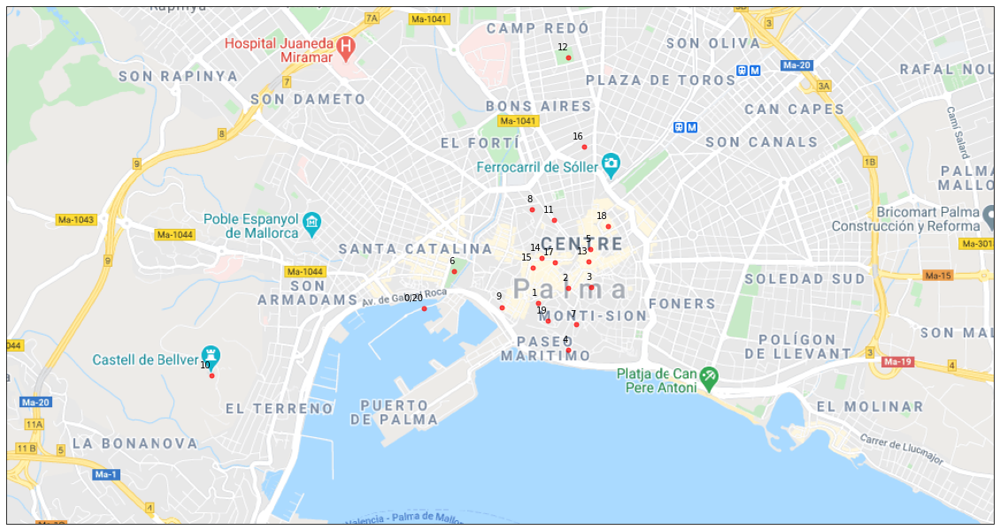

In [6]:
# values
tourist = 15
latitude = tasks['latitude'].values[troutes.iloc[tourist,:]]
longitude = tasks['longitude'].values[troutes.iloc[tourist,:]]
sites = troutes.iloc[tourist,:]
visit_order = [str(i) for i in range(0, len(troutes.iloc[tourist,:]))]

if len(set(sites)) != len(sites):
    dupl_route_df = pd.DataFrame(list(zip(visit_order, sites, latitude, longitude)), 
                                 columns=['visit_order','sites', 'latitude', 'longitude'])\
                       .groupby(['sites', 'latitude', 'longitude']).apply(lambda x: ','.join(x.visit_order))
    sites = [ name  for (name,_,_) in dupl_route_df.index.values]
    latitude = [ lat  for (_,lat,_) in dupl_route_df.index.values]
    longitude = [ lon  for (_,_,lon) in dupl_route_df.index.values]
    visit_order = dupl_route_df.values

# Map background
ffig = plt.figure(figsize=(20,25))

tiler = cimgt.GoogleTiles()
mercator = tiler.crs
ax = plt.axes(projection=mercator)

llcrnrlat=39.553956  # The lower left corner geographical latitude
llcrnrlon=2.601714   # The lower left corner geographical longitude
urcrnrlat=39.588358  # The upper right corner geographical latitude
urcrnrlon=2.686728 

ax.set_extent([llcrnrlon,urcrnrlon, llcrnrlat, urcrnrlat], ccrs.PlateCarree())

zoom = 14
ax.add_image(tiler, zoom )

plt.plot(longitude, latitude, marker='o', color='red', markersize=5, lw=0,
         alpha=0.7, transform=ccrs.Geodetic())

for visit_order_, xpt, ypt in zip(visit_order, longitude, latitude):
     plt.text(xpt, ypt+0.0005, visit_order_, horizontalalignment='right', transform=ccrs.Geodetic())

plt.show()

Plot situation at time 3.

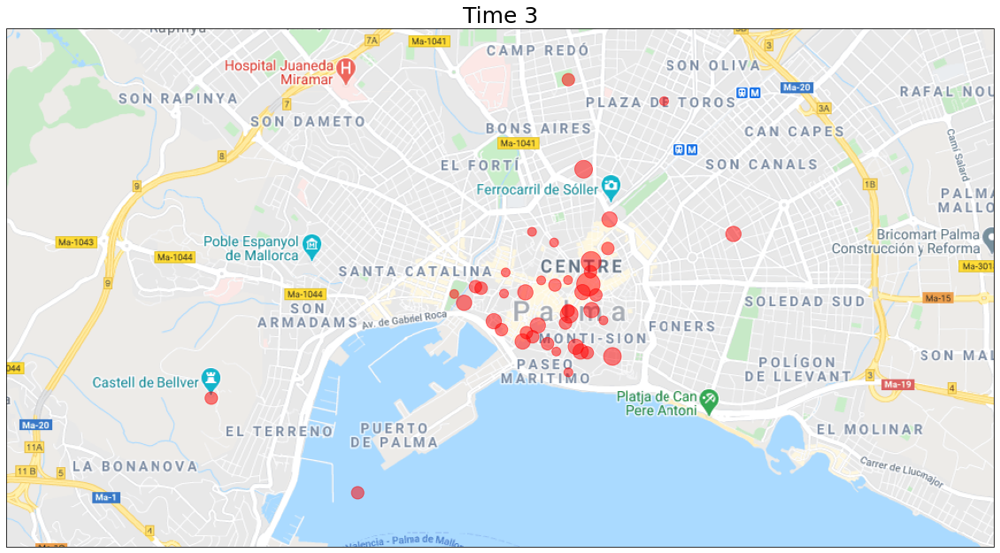

In [7]:
# values
time = 3
latitude = tasks.latitude
longitude = tasks.longitude
sites = tasks.place
n_tourists = summary.iloc[time]*100

# Map background
ffig = plt.figure(figsize=(20,25))

tiler = cimgt.GoogleTiles()
mercator = tiler.crs
ax = plt.axes(projection=mercator)

ax.set_title(f'Time {time}', fontsize=25)

llcrnrlat=39.553956  # The lower left corner geographical latitude
llcrnrlon=2.601714   # The lower left corner geographical longitude
urcrnrlat=39.588358  # The upper right corner geographical latitude
urcrnrlon=2.686728   # The upper left corner geographical latitude

ax.set_extent([llcrnrlon,urcrnrlon, llcrnrlat, urcrnrlat], ccrs.PlateCarree())


zoom = 14
ax.add_image(tiler, zoom )

ax.scatter(longitude,latitude, s=n_tourists, 
           color='red', alpha=0.5,
           transform=ccrs.PlateCarree())


plt.show()

save images

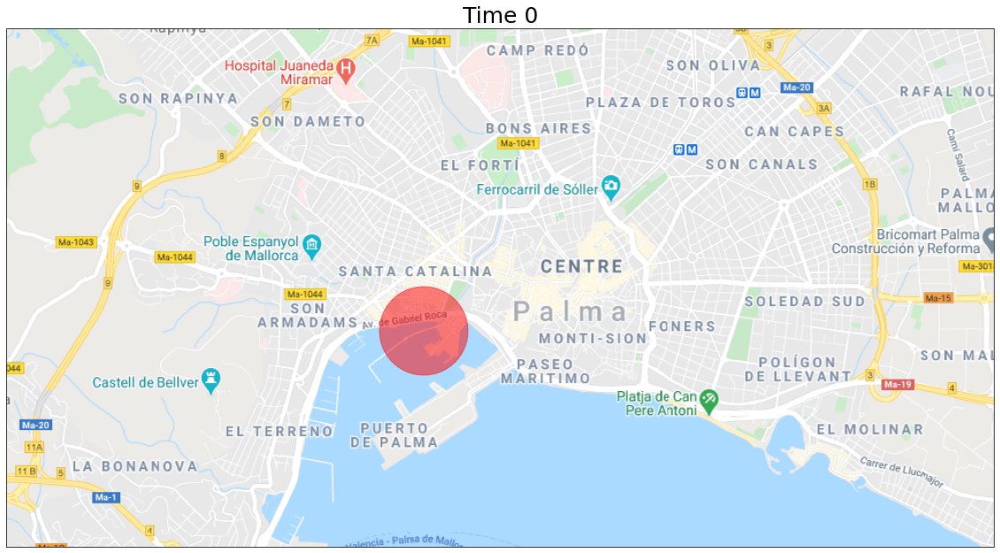

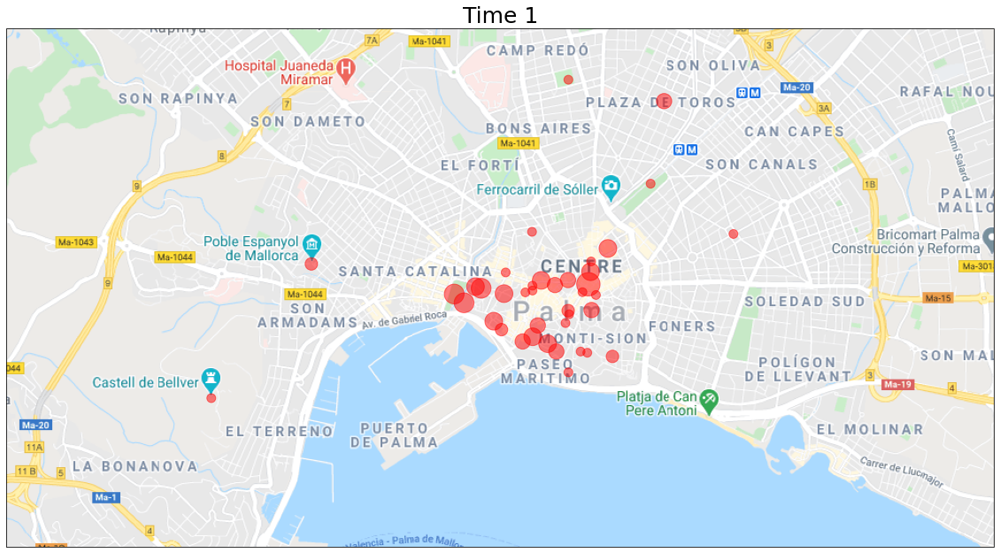

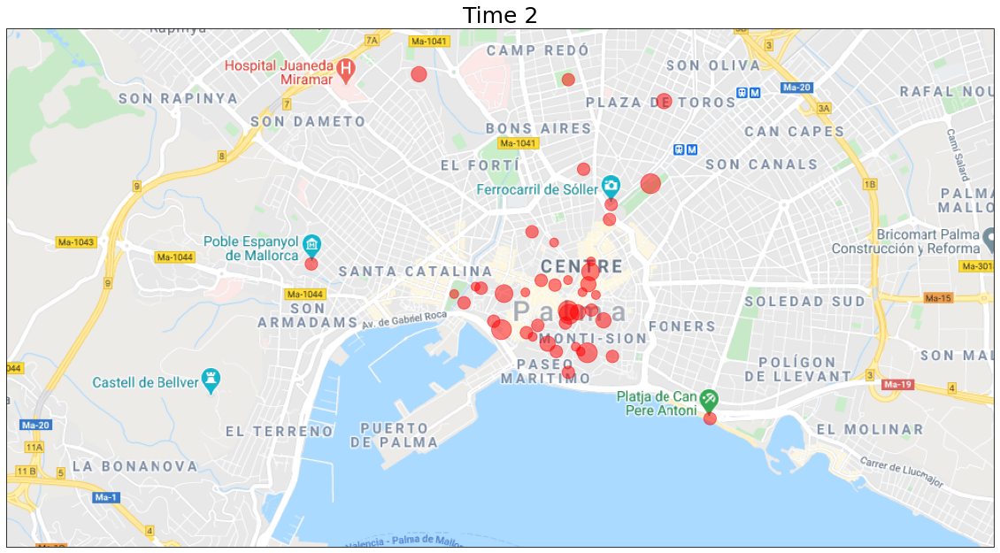

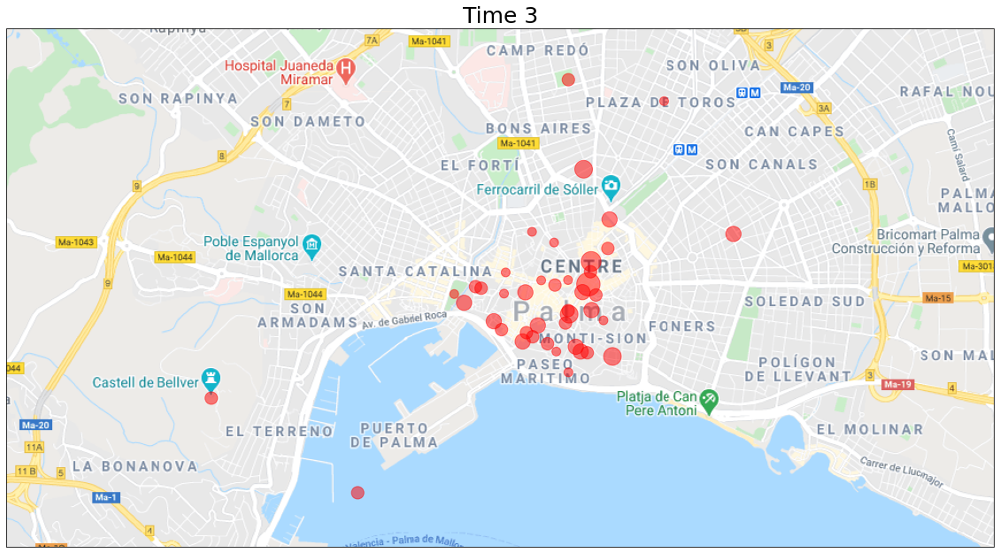

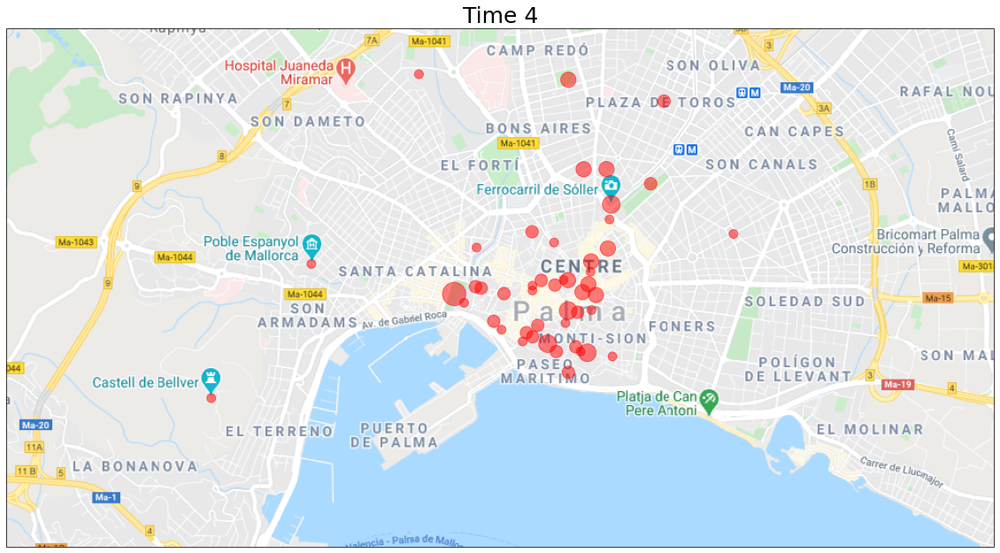

...

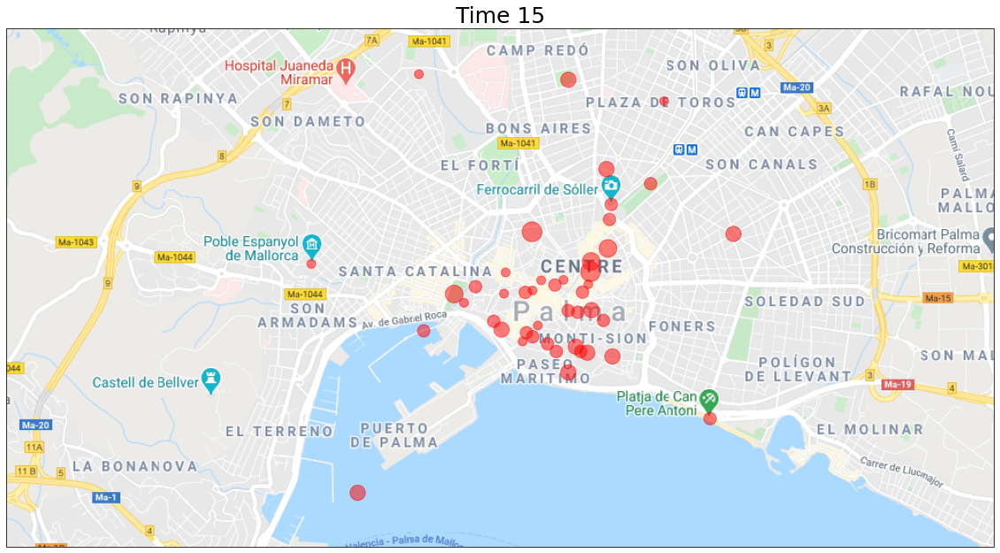

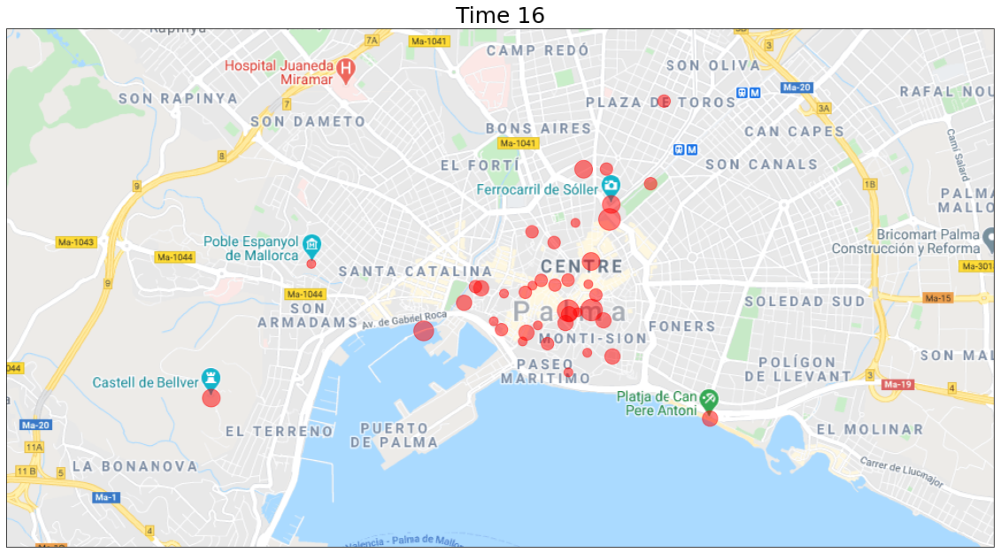

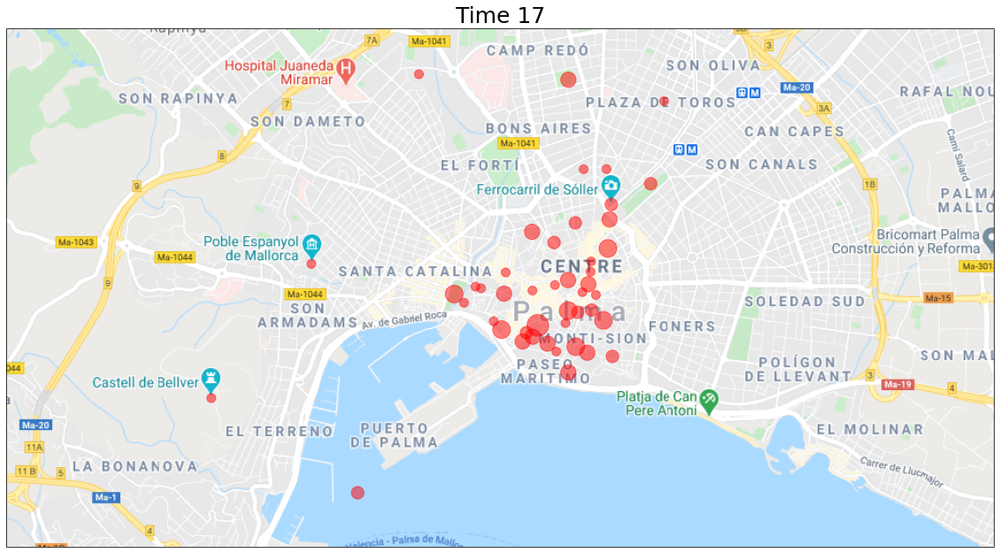

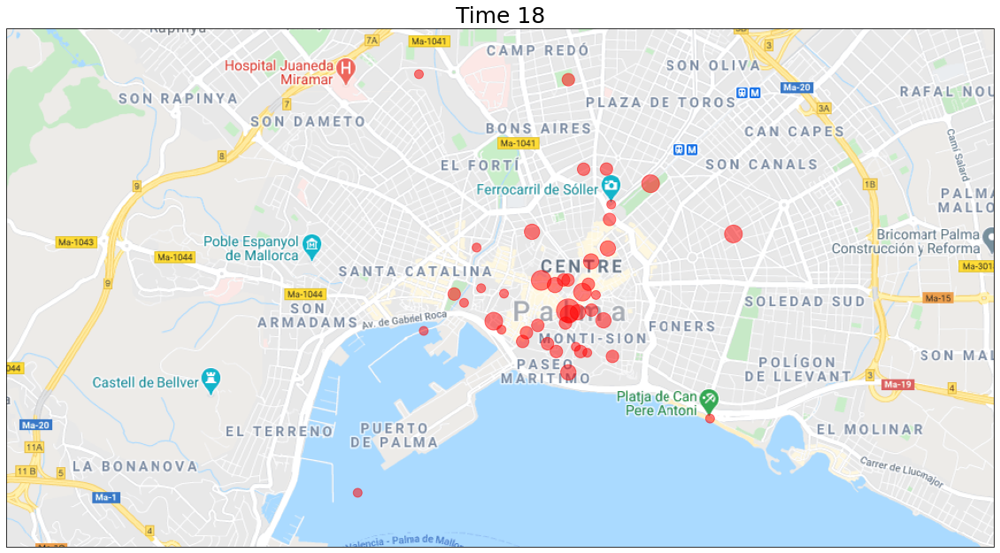

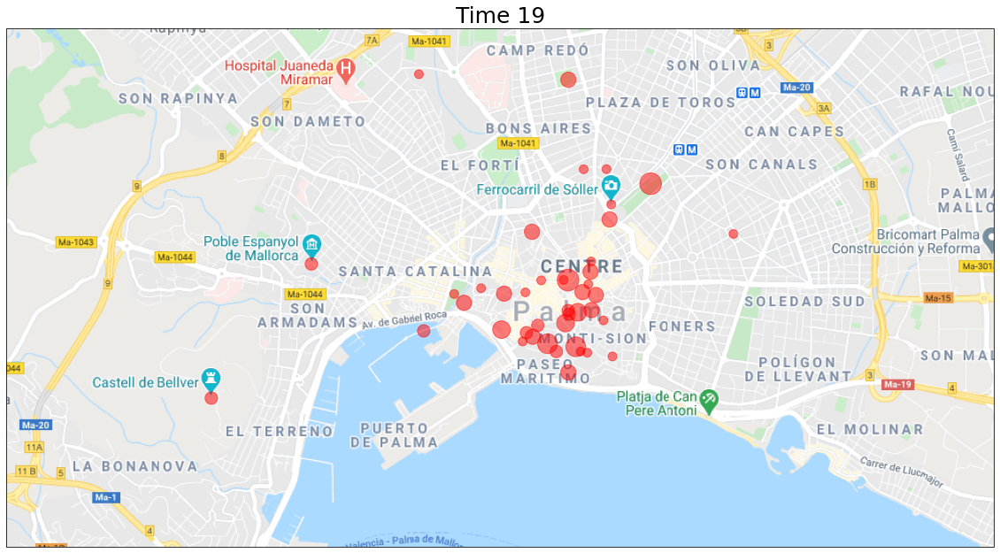

In [8]:
image_list = list()
time = 20
for t in range(0, time):
    # values
    latitude = tasks.latitude
    longitude = tasks.longitude
    sites = tasks.place
    n_tourists = summary.iloc[t]*100

    # Map background
    fig = plt.figure(figsize=(20,25))

    tiler = cimgt.GoogleTiles()
    mercator = tiler.crs
    ax = plt.axes(projection=mercator)
    
    ax.set_title(f'Time {t}', fontsize=25)

    llcrnrlat=39.553956  # The lower left corner geographical latitude
    llcrnrlon=2.601714   # The lower left corner geographical longitude
    urcrnrlat=39.588358  # The upper right corner geographical latitude
    urcrnrlon=2.686728   # The upper left corner geographical latitude

    ax.set_extent([llcrnrlon,urcrnrlon, llcrnrlat, urcrnrlat], ccrs.PlateCarree())

    zoom = 14
    ax.add_image(tiler, zoom )

    ax.scatter(longitude,latitude, s=n_tourists, 
               color='red', alpha=0.5,
               transform=ccrs.PlateCarree())


    plt.savefig(f'palmadata/plots/sim_100_{t}.png', dpi=199)

### Gif

In [9]:
import imageio
from pygifsicle import optimize

In [10]:
images = []
time = 20
for t in range(0, time):
    images.append(imageio.imread(f"palmadata/plots/sim_100_{t}.png"))
imageio.mimsave('palmadata/plots/sim_100.gif', images)
optimize("palmadata/plots/sim_100.gif")